In [1]:
# -*- coding: utf-8 -*-
#
#  Copyright 2024 Technical University of Denmark
#  Authored by: Piotr Budzisz (DTU)
#
#  Licensed under the Apache License, Version 2.0 (the "License");
#  you may not use this file except in compliance with the License.
#  You may obtain a copy of the License at
#
#      http://www.apache.org/licenses/LICENSE-2.0
#
#  Unless required by applicable law or agreed to in writing, software
#  distributed under the License is distributed on an "AS IS" BASIS,
#  WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
#  See the License for the specific language governing permissions and
#  limitations under the License.
#
# The dataset and files mentioned belong to the CFU (Center for Fast Ultrasound Imaging) at DTU (Technical University of Denmark).
#
#  Note: The following code has been created for the purpose of a master's thesis by Piotr Budzisz titled
#  "Computational reduction of reconstruction artifacts in stitching-based biomedical computed tomography,"
#  written at the Technical University of Denmark. The file is based on and reuses parts and descriptions
#  from the Core Imaging Library notebooks created by :
#
#                   Jakob S. Jørgensen (DTU)
#                   Gemma Fardell (UKRI-STFC)
#                   Laura Murgatroyd (UKRI-STFC)
#
#  which can be found in the GitHub repository (https://github.com/TomographicImaging/CIL-Demos).
#  Copyright 2021 - 2022 United Kingdom Research and Innovation
#  Copyright 2021 - 2022 The University of Manchester
#  Copyright 2021 - 2022 Technical University of Denmark
#

# Projection blocking simulation on Shepp Logan phantom

In [2]:
# cil imports
from cil.framework import ImageData, ImageGeometry
from cil.framework import AcquisitionGeometry, AcquisitionData

from cil.processors import Slicer, AbsorptionTransmissionConverter, TransmissionAbsorptionConverter

from cil.optimisation.functions import IndicatorBox
from cil.optimisation.algorithms import CGLS, SIRT

from cil.plugins.astra.operators import ProjectionOperator
from cil.plugins.astra.processors import FBP

from cil.plugins import TomoPhantom

from cil.utilities import dataexample
from cil.utilities.display import show2D, show1D, show_geometry

# External imports
import numpy as np
import matplotlib.pyplot as plt
import logging

In [3]:
# Set logging level for CIL processors:
logging.basicConfig(level=logging.WARNING)
cil_log_level = logging.getLogger('cil.processors')
cil_log_level.setLevel(logging.INFO)

In [4]:
cmap = "gray"
device = 'gpu'

In [5]:
#number of pixels
n_pixels_phantom = 512
n_pixels_detector = 400

# Angles
angles = np.linspace(0, 180, 180, endpoint=False, dtype=np.float32)

# Setup acquisition geometry (detector)
ag = AcquisitionGeometry.create_Parallel2D(detector_position=[0,3])\
                            .set_angles(angles)\
                            .set_panel(400, pixel_size=0.007)

# Setup acquisition geometry (detector)
ag_512 = AcquisitionGeometry.create_Parallel2D(detector_position=[0,3])\
                            .set_angles(angles)\
                            .set_panel(512, pixel_size=0.007)
                           
# Setup image geometry for entire phantom
ig = ImageGeometry(voxel_num_x=512, 
                   voxel_num_y=512, 
                   voxel_size_x=0.007, 
                   voxel_size_y=0.007)

# Get phantom
phantom = TomoPhantom.get_ImageData(num_model=1, geometry=ig)


# Setup image geometry for a quarter of the phantom                   
ig_1 = ImageGeometry(voxel_num_x = 512,
                     voxel_num_y = 512,
                     voxel_size_x = 0.007,
                     voxel_size_y = 0.007,
                     center_x = -128 * ig.voxel_size_x,
                     center_y = -128 * ig.voxel_size_y)
                  
ig_2 = ImageGeometry(voxel_num_x = 512,
                     voxel_num_y = 512,
                     voxel_size_x = 0.007,
                     voxel_size_y = 0.007,
                     center_x = 128 * ig.voxel_size_x,
                     center_y = -128 * ig.voxel_size_y)
                
ig_3 = ImageGeometry(voxel_num_x = 512,
                     voxel_num_y = 512,
                     voxel_size_x = 0.007,
                     voxel_size_y = 0.007,
                     center_x = -128 * ig.voxel_size_x,
                     center_y = 128 * ig.voxel_size_y)
                  
ig_4 = ImageGeometry(voxel_num_x = 512,
                     voxel_num_y = 512,
                     voxel_size_x = 0.007,
                     voxel_size_y = 0.007,
                     center_x = 128 * ig.voxel_size_x,
                     center_y = 128 * ig.voxel_size_y)


# geometry for final reconstruction
ig_400 = ImageGeometry(voxel_num_x=400, 
                   voxel_num_y=400, 
                   voxel_size_x=0.007, 
                   voxel_size_y=0.007)

In [6]:
# Create projection operator using Astra-Toolbox.
A_512 = ProjectionOperator(ig, ag_512, device)

In [7]:
sino = A_512.direct(phantom)

In [8]:
fbp = FBP(ig, ag_512, device)
recon_fbp = fbp(sino)

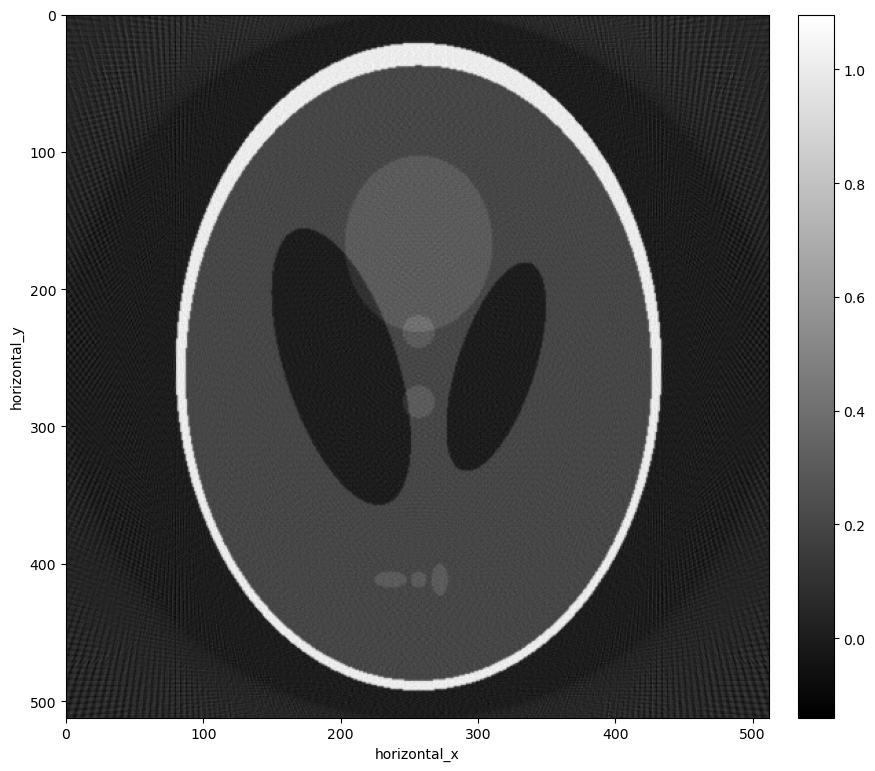

In [9]:
show2D(recon_fbp, cmap=cmap, num_cols=2, size=(15,15), origin='upper-left')

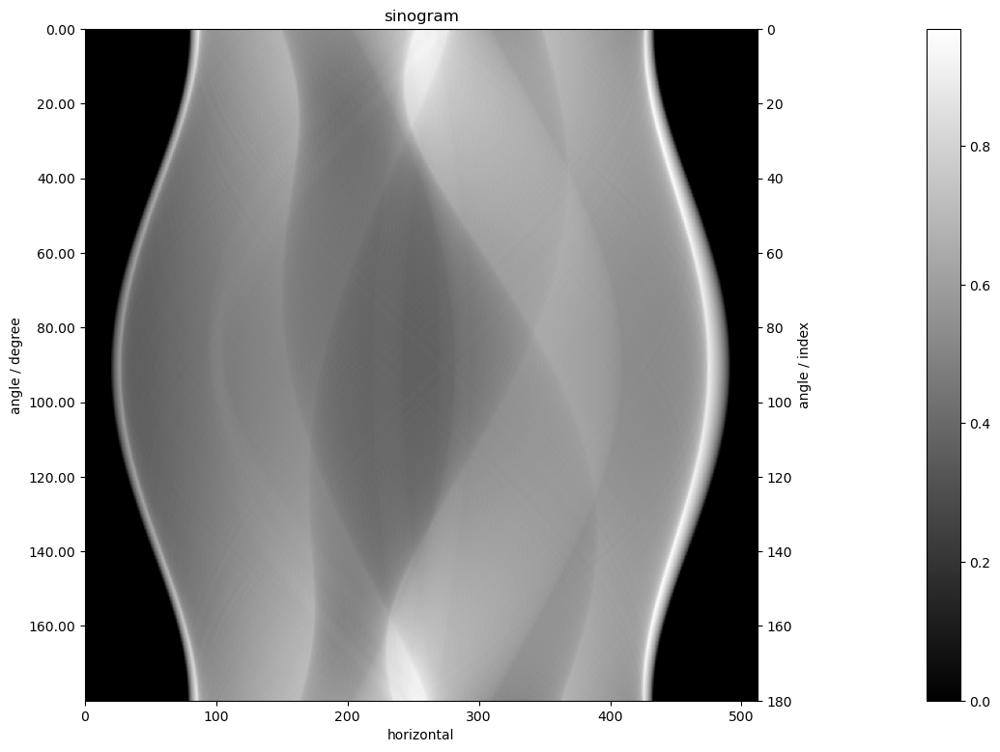

In [10]:
show2D([sino], ['sinogram'], \
       cmap=cmap, num_cols=1, size=(15,15), origin='upper-left')

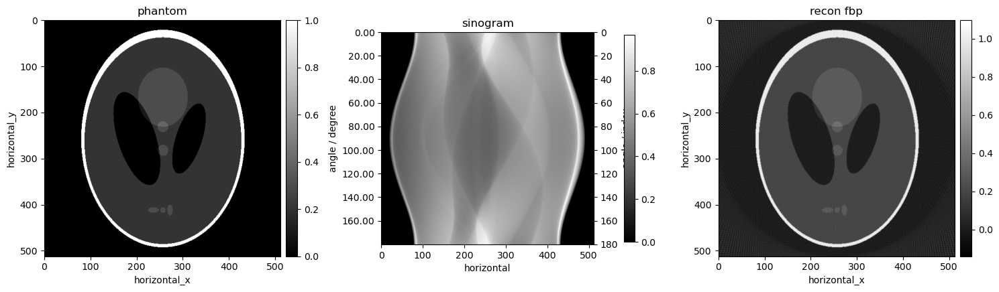

In [11]:
show2D([phantom, sino, recon_fbp], ['phantom', 'sinogram', 'recon fbp'], \
       cmap=cmap, num_cols=3, size=(15,15), origin='upper-left')

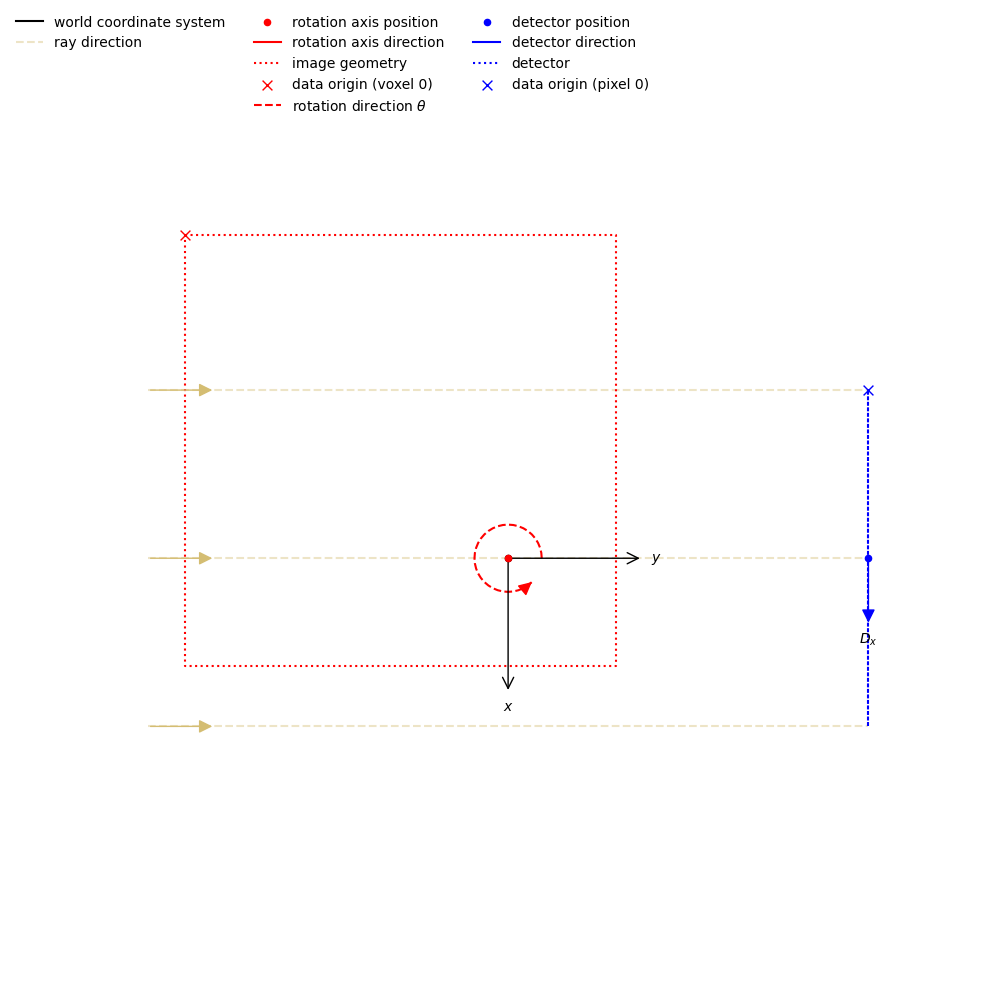

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/ig_1.png


<Figure size 640x480 with 0 Axes>

In [12]:
show_geometry(ag, ig_1).save('ig_1.png')

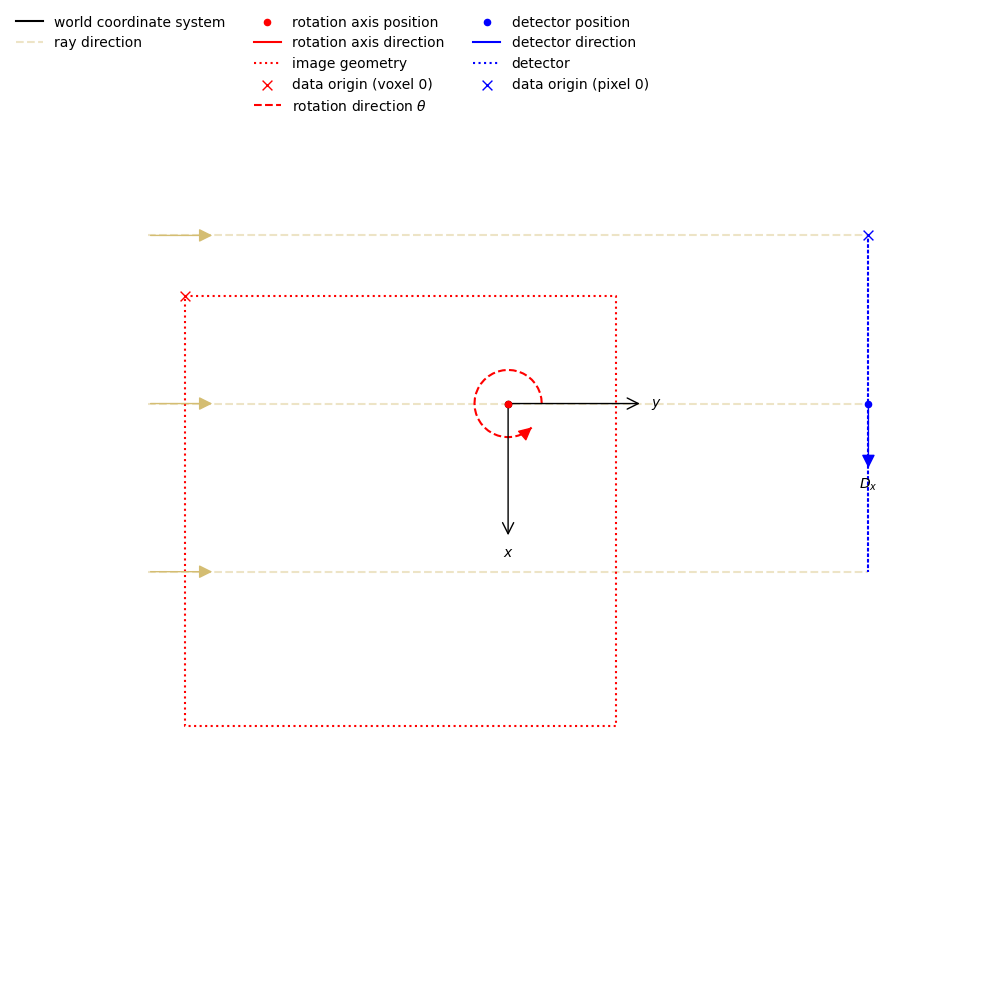

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/ig_2.png


<Figure size 640x480 with 0 Axes>

In [13]:
show_geometry(ag, ig_2).save('ig_2.png')

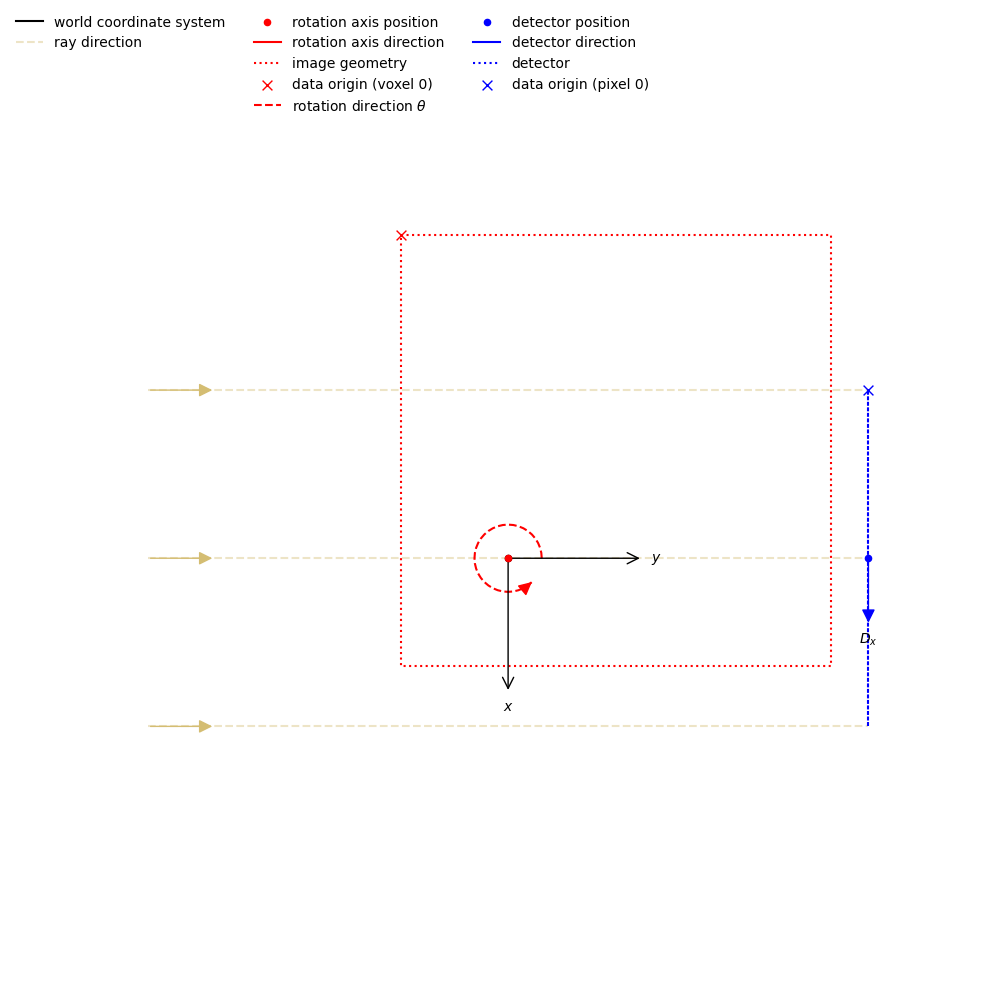

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/ig_3.png


<Figure size 640x480 with 0 Axes>

In [14]:
show_geometry(ag, ig_3).save('ig_3.png')

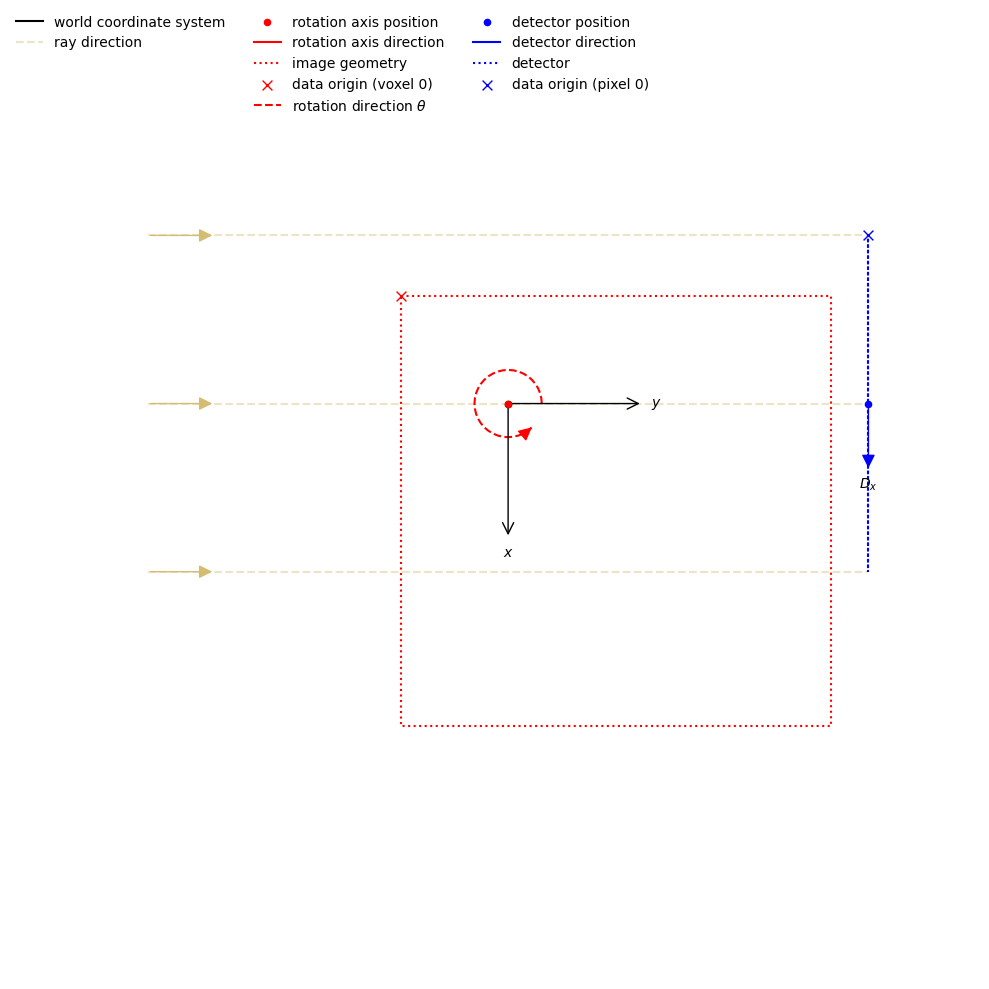

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/ig_4.png


<Figure size 640x480 with 0 Axes>

In [15]:
show_geometry(ag, ig_4).save('ig_4.png')

In [16]:
A_1 = ProjectionOperator(ig_1, ag, device)
sino_1 = A_1.direct(phantom)

In [17]:
A_2 = ProjectionOperator(ig_2, ag, device)
sino_2 = A_2.direct(phantom)

In [18]:
A_3 = ProjectionOperator(ig_3, ag, device)
sino_3 = A_3.direct(phantom)

In [19]:
A_4 = ProjectionOperator(ig_4, ag, device)
sino_4 = A_4.direct(phantom)

In [20]:
fbp = FBP(ig_1, ag, device)
recon_fbp_1 = fbp(sino_1)

In [21]:
fbp = FBP(ig_2, ag, device)
recon_fbp_2 = fbp(sino_2)

In [22]:
fbp = FBP(ig_3, ag, device)
recon_fbp_3 = fbp(sino_3)

In [23]:
fbp = FBP(ig_4, ag, device)
recon_fbp_4 = fbp(sino_4)

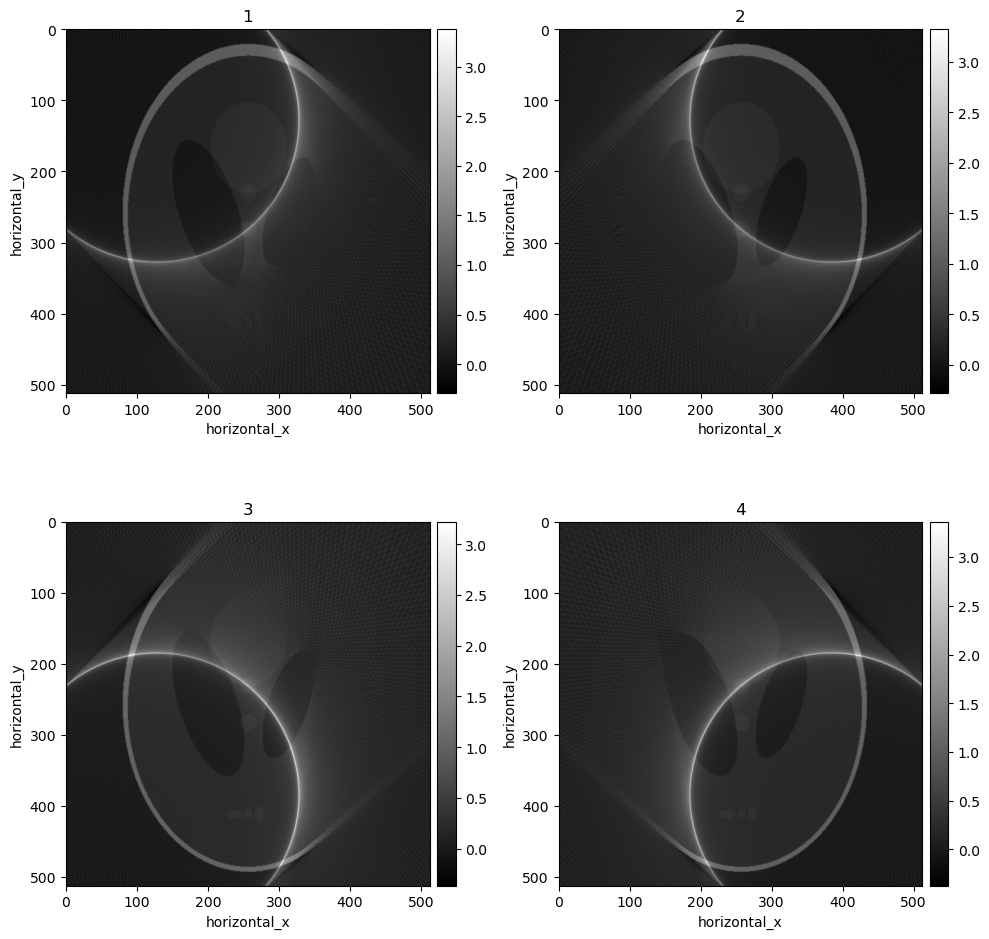

In [24]:
show2D([recon_fbp_4, recon_fbp_3, recon_fbp_2, recon_fbp_1], ['1', '2', '3', '4'], \
       cmap=cmap, num_cols=2, size=(10,10), origin='upper-left')

In [25]:
fbp = FBP(ig_400, ag, device)
recon_fbp_1 = fbp(sino_1)
recon_fbp_2 = fbp(sino_2)
recon_fbp_3 = fbp(sino_3)
recon_fbp_4 = fbp(sino_4)

In [26]:
import os
from cil.io import TIFFWriter
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'sino_4.tiff')
TIFFWriter(data=sino_4, file_name=save_path).write()

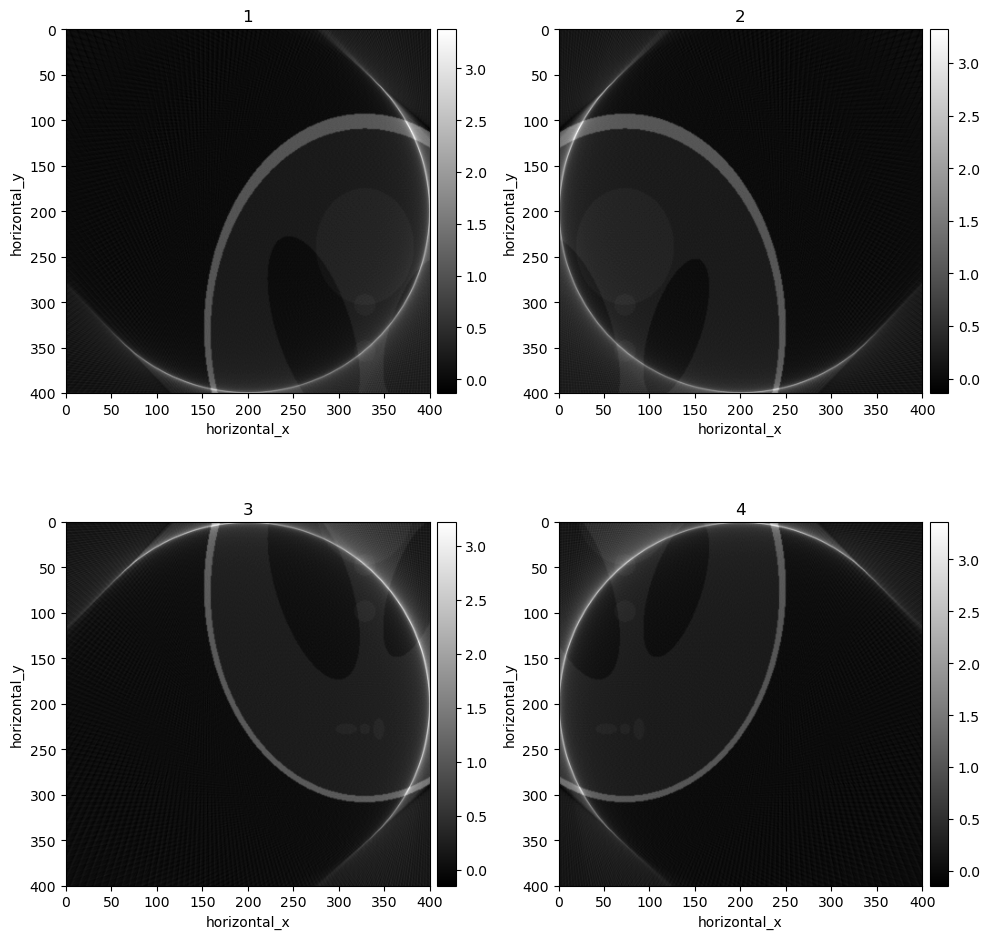

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/four_slices.png


<Figure size 640x480 with 0 Axes>

In [27]:
show2D([recon_fbp_4, recon_fbp_3, recon_fbp_2, recon_fbp_1], ['1', '2', '3', '4'], \
       cmap=cmap, num_cols=2, size=(10,10), origin='upper-left').save('four_slices.png')

In [28]:
import os
from cil.io import TIFFWriter
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'part_3_400.tiff')
TIFFWriter(data=recon_fbp_3, file_name=save_path).write()

In [29]:
# apply circle mask 
from numpy import arange, meshgrid, isscalar, ndarray, pi, roll

# circle mask
offset = 0

siz = 400
if siz % 2:
    rang = arange(-siz / 2 + 1, siz / 2 + 1)
else:
    rang = arange(-siz / 2,siz / 2)
x,y = meshgrid(rang,rang)
z = x ** 2 + y ** 2
a = (z < (siz / 2 - abs(offset)) ** 2)

In [30]:
recon_fbp_1 = recon_fbp_1 * a
recon_fbp_2 = recon_fbp_2 * a
recon_fbp_3 = recon_fbp_3 * a
recon_fbp_4 = recon_fbp_4 * a

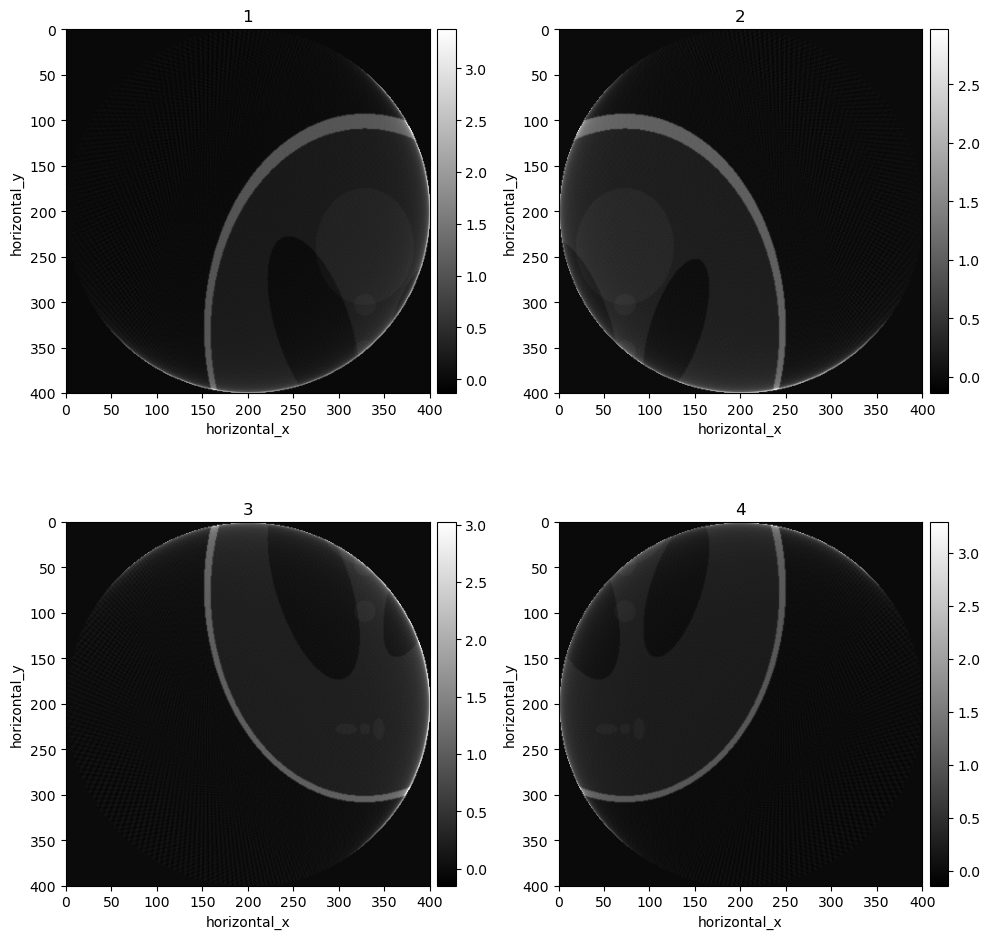

In [31]:
show2D([recon_fbp_4, recon_fbp_3, recon_fbp_2, recon_fbp_1], ['1', '2', '3', '4'], \
       cmap=cmap, num_cols=2, size=(10,10), origin='upper-left')

In [32]:
import os
from cil.io import TIFFWriter
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'sl_1_400.tiff')
TIFFWriter(data=recon_fbp_1, file_name=save_path).write()

# Pre-reconstruction stitching

In [33]:
from cil.framework import BlockDataContainer

In [34]:
# CIL optimisation algorithms and linear operators
from cil.optimisation.algorithms import CGLS
from cil.optimisation.operators import BlockOperator, GradientOperator, IdentityOperator, FiniteDifferenceOperator

In [35]:
A1 = ProjectionOperator(ig_1, ag)
A2 = ProjectionOperator(ig_2, ag)
A3 = ProjectionOperator(ig_3, ag)
A4 = ProjectionOperator(ig_4, ag)

In [36]:
A_big = BlockOperator(A1, A2, A3, A4)

In [37]:
b1 = sino_1
b2 = sino_2
b3 = sino_3
b4 = sino_4

In [38]:
b_big = BlockDataContainer(b1, b2, b3, b4)

In [39]:
# initial estimate - zero array in this case 
initial = ig.allocate(0)

# setup CGLS
cgls = CGLS(initial=initial, 
            operator=A_big, 
            data=b_big,
            max_iteration = 100,
            update_objective_interval = 1 )

In [40]:
# run N interations
cgls.run(50, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          6.60912e+04
        1        100         0.047          5.47715e+03
        2        100         0.045          2.10459e+03
        3        100         0.044          9.67681e+02
        4        100         0.043          5.99553e+02
        5        100         0.044          3.43908e+02
        6        100         0.043          1.80019e+02
        7        100         0.043          1.58313e+02
        8        100         0.043          1.06073e+02
        9        100         0.043          6.40795e+01
       10        100         0.043          3.77915e+01
       11        100         0.043          2.44225e+01
       12        100         0.043          2.03568e+01
       13        100         0.043          1.66792e+01
       14        100         0.043          1.22352e+01
       15        100         0.043          8.83

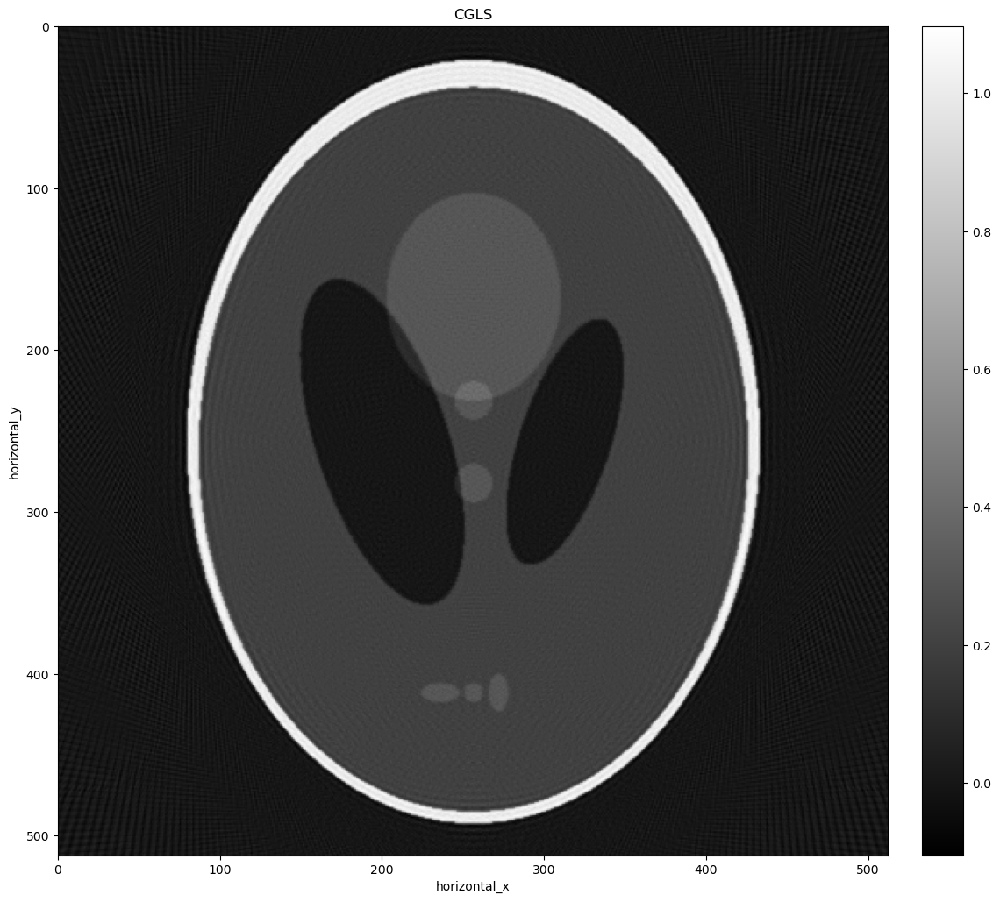

In [41]:
# get and visualise the results
recon_cgls = cgls.solution

show2D([recon_cgls], ['CGLS'], \
       cmap=cmap, num_cols=1, size=(20,20), origin='upper-left')

In [42]:
difference = phantom - recon_cgls

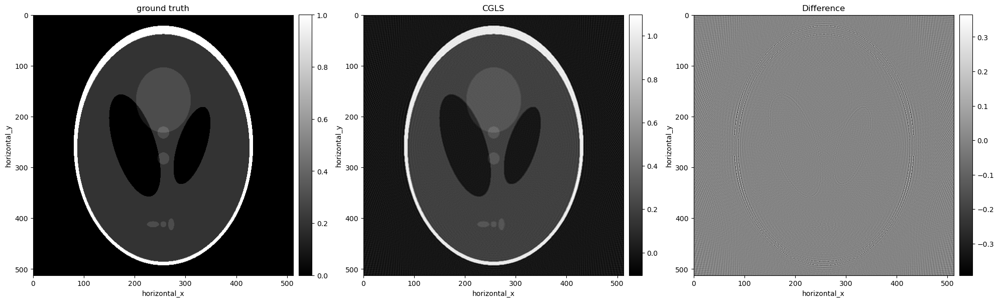

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/gtvscgls.png


<Figure size 640x480 with 0 Axes>

In [43]:
show2D([phantom, recon_cgls, difference], ['ground truth', 'CGLS', 'Difference'], \
       cmap=cmap, num_cols=3, size=(20,20), origin='upper-left').save('gtvscgls.png')

In [44]:
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'difference.tiff')
TIFFWriter(data=difference, file_name=save_path).write()

# Adding noise for complexity

In [45]:
# Incident intensity: lower counts will increase the noise
background_counts = 600

In [46]:
counts = background_counts * np.exp(-sino.as_array())
tmp = np.exp(-sino.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)

# allocate sino_noisy and fill with noisy data
sino_noisy = ag_512.allocate()
sino_noisy.fill(sino_out)

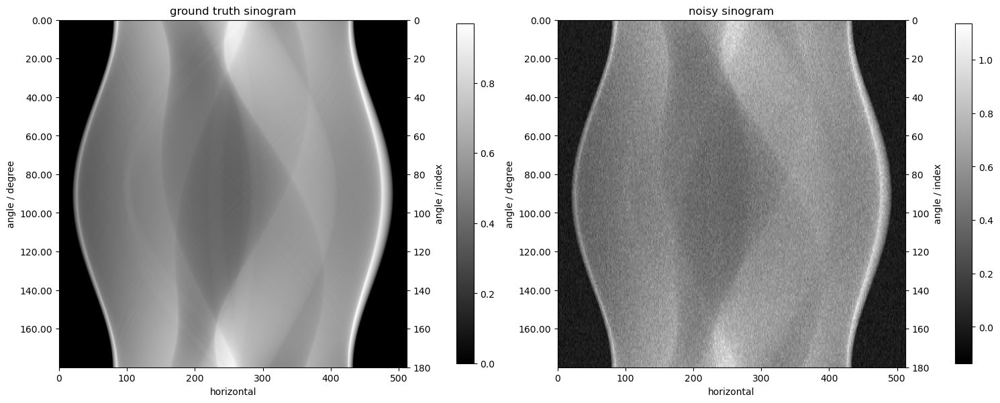

In [47]:
# visualise results
show2D([sino, sino_noisy], ['ground truth sinogram', 'noisy sinogram'], \
       cmap=cmap, num_cols=2, size=(15,10), origin='upper-left')

In [48]:
counts = background_counts * np.exp(-sino_1.as_array())
tmp = np.exp(-sino_1.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino_1.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)

# allocate sino_noisy and fill with noisy data
sino_1_noisy = ag.allocate()
sino_1_noisy.fill(sino_out)

In [49]:
counts = background_counts * np.exp(-sino_2.as_array())
tmp = np.exp(-sino_2.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino_2.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)

# allocate sino_noisy and fill with noisy data
sino_2_noisy = ag.allocate()
sino_2_noisy.fill(sino_out)

In [50]:
counts = background_counts * np.exp(-sino_3.as_array())
tmp = np.exp(-sino_3.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino_3.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)

# allocate sino_noisy and fill with noisy data
sino_3_noisy = ag.allocate()
sino_3_noisy.fill(sino_out)

In [51]:
counts = background_counts * np.exp(-sino_4.as_array())
tmp = np.exp(-sino_4.as_array())
noisy_counts = np.random.poisson(counts)
nonzero = noisy_counts > 0
sino_out = np.zeros_like(sino_4.as_array())
sino_out[nonzero] = -np.log(noisy_counts[nonzero] / background_counts)

# allocate sino_noisy and fill with noisy data
sino_4_noisy = ag.allocate()
sino_4_noisy.fill(sino_out)

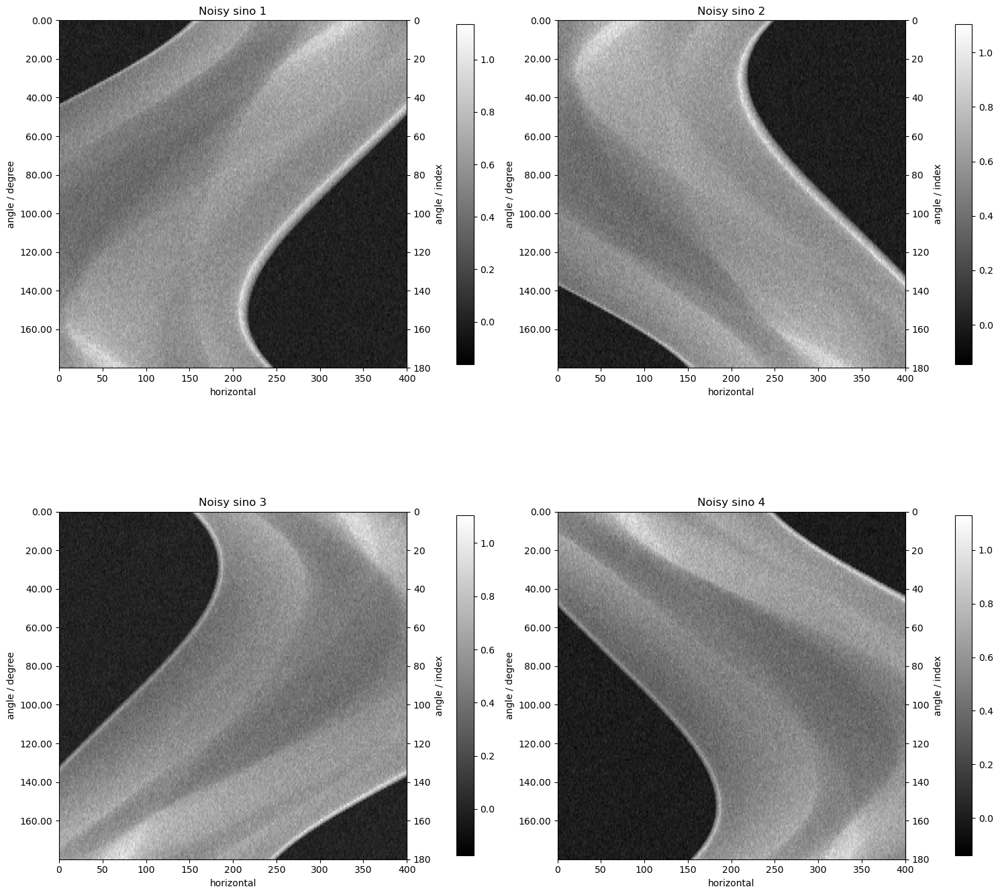

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/noisy_sinograms.png


<Figure size 640x480 with 0 Axes>

In [52]:
# visualise results
show2D([sino_4_noisy, sino_3_noisy, sino_2_noisy, sino_1_noisy], ['Noisy sino 1', 'Noisy sino 2', 'Noisy sino 3', 'Noisy sino 4'], \
       cmap=cmap, num_cols=2, size=(15,15), origin='upper-left').save('noisy_sinograms.png')

In [53]:
import os
from cil.io import TIFFWriter
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'sino_1_noisy.tiff')
TIFFWriter(data=sino_1_noisy, file_name=save_path).write()

## Noisy slices stitching

In [54]:
fbp = FBP(ig_400, ag, device)
noisy_recon_fbp_1 = fbp(sino_1_noisy)
noisy_recon_fbp_2 = fbp(sino_2_noisy)
noisy_recon_fbp_3 = fbp(sino_3_noisy)
noisy_recon_fbp_4 = fbp(sino_4_noisy)

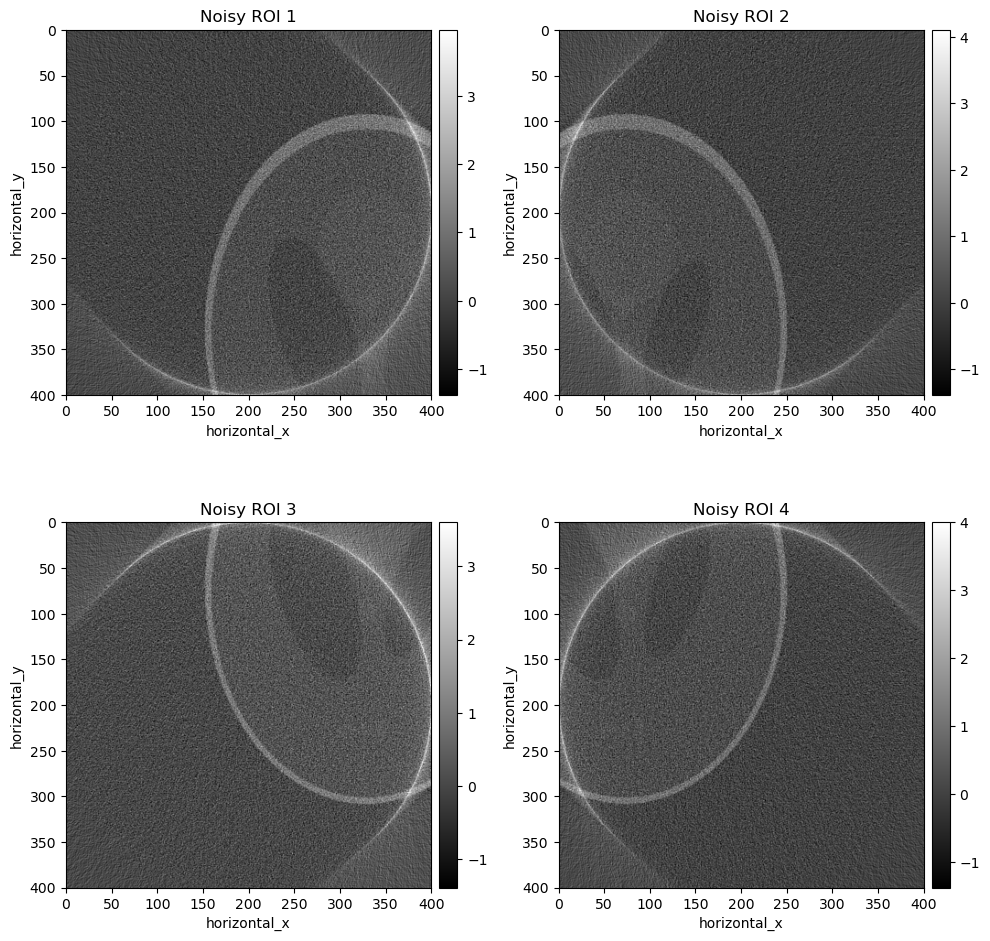

Saved image as /dtu/cfu/home/s220464/Code/OverleafCode/four_noisy_slices.png


<Figure size 640x480 with 0 Axes>

In [56]:
show2D([noisy_recon_fbp_4, noisy_recon_fbp_3, noisy_recon_fbp_2, noisy_recon_fbp_1], ['Noisy ROI 1', 'Noisy ROI 2', 'Noisy ROI 3', 'Noisy ROI 4'], \
       cmap=cmap, num_cols=2, size=(10,10), origin='upper-left').save('four_noisy_slices.png')

In [53]:
# apply circle mask 
from numpy import arange, meshgrid, isscalar, ndarray, pi, roll

# circle mask
offset = 0

siz = 400
if siz % 2:
    rang = arange(-siz / 2 + 1, siz / 2 + 1)
else:
    rang = arange(-siz / 2,siz / 2)
x,y = meshgrid(rang,rang)
z = x ** 2 + y ** 2
a = (z < (siz / 2 - abs(offset)) ** 2)

In [54]:
noisy_recon_fbp_1 = noisy_recon_fbp_1 * a
noisy_recon_fbp_2 = noisy_recon_fbp_2 * a
noisy_recon_fbp_3 = noisy_recon_fbp_3 * a
noisy_recon_fbp_4 = noisy_recon_fbp_4 * a

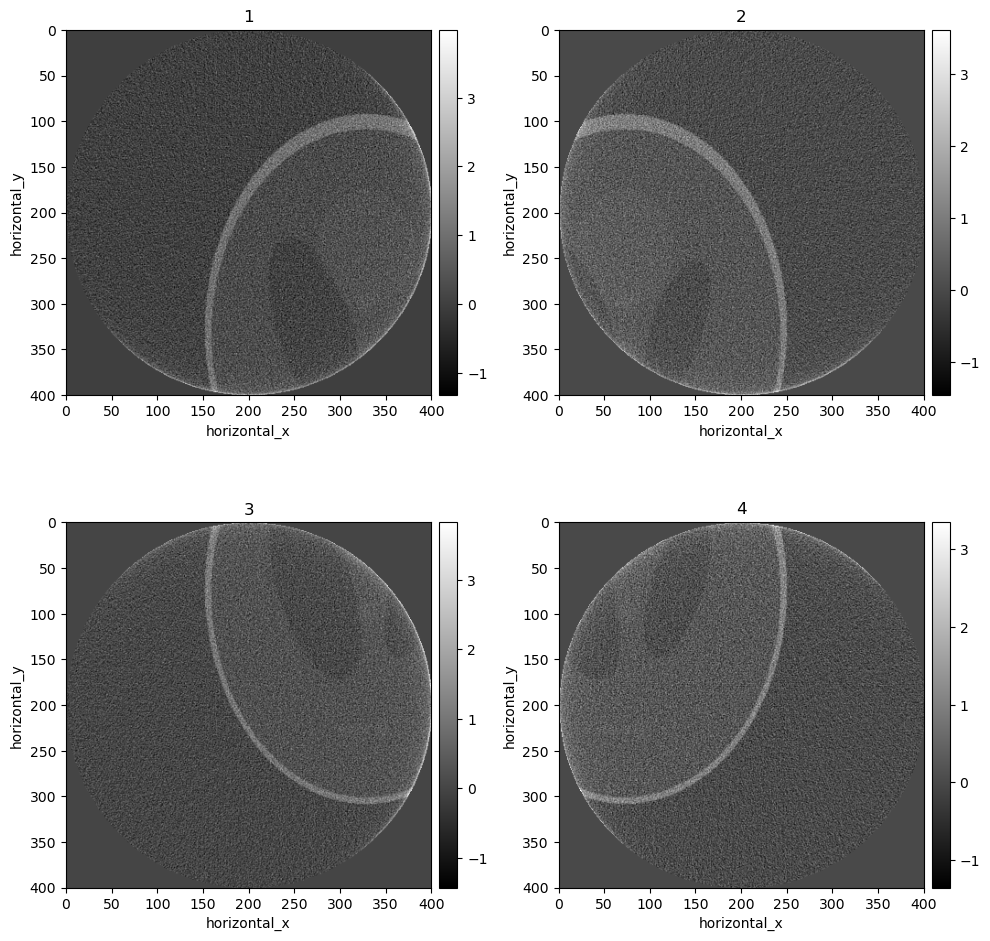

In [55]:
show2D([noisy_recon_fbp_4, noisy_recon_fbp_3, noisy_recon_fbp_2, noisy_recon_fbp_1], ['1', '2', '3', '4'], \
       cmap=cmap, num_cols=2, size=(10,10), origin='upper-left')

In [59]:
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3'
save_path = os.path.join(save_base_path, 'noisy_sl_1_400.tiff')
TIFFWriter(data=noisy_recon_fbp_1, file_name=save_path).write()

## Nosiy projection blocking

In [60]:
b1 = sino_1_noisy
b2 = sino_2_noisy
b3 = sino_3_noisy
b4 = sino_4_noisy

In [61]:
b_big = BlockDataContainer(b1, b2, b3, b4)

In [62]:
# initial estimate - zero array in this case 
initial = ig.allocate(0)

# setup CGLS
cgls = CGLS(initial=initial, 
            operator=A_big, 
            data=b_big,
            max_iteration = 100,
            update_objective_interval = 1 )

In [63]:
# run N interations
cgls.run(50, verbose=True)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0        100         0.000          6.71960e+04
        1        100         0.044          6.23605e+03
        2        100         0.044          2.84506e+03
        3        100         0.043          1.69066e+03
        4        100         0.043          1.30562e+03
        5        100         0.043          1.02733e+03
        6        100         0.044          8.41884e+02
        7        100         0.044          8.15013e+02
        8        100         0.043          7.43314e+02
        9        100         0.044          6.80326e+02
       10        100         0.044          6.33674e+02
       11        100         0.044          6.09813e+02
       12        100         0.044          5.96641e+02
       13        100         0.044          5.80745e+02
       14        100         0.044          5.64986e+02
       15        100         0.044          5.51

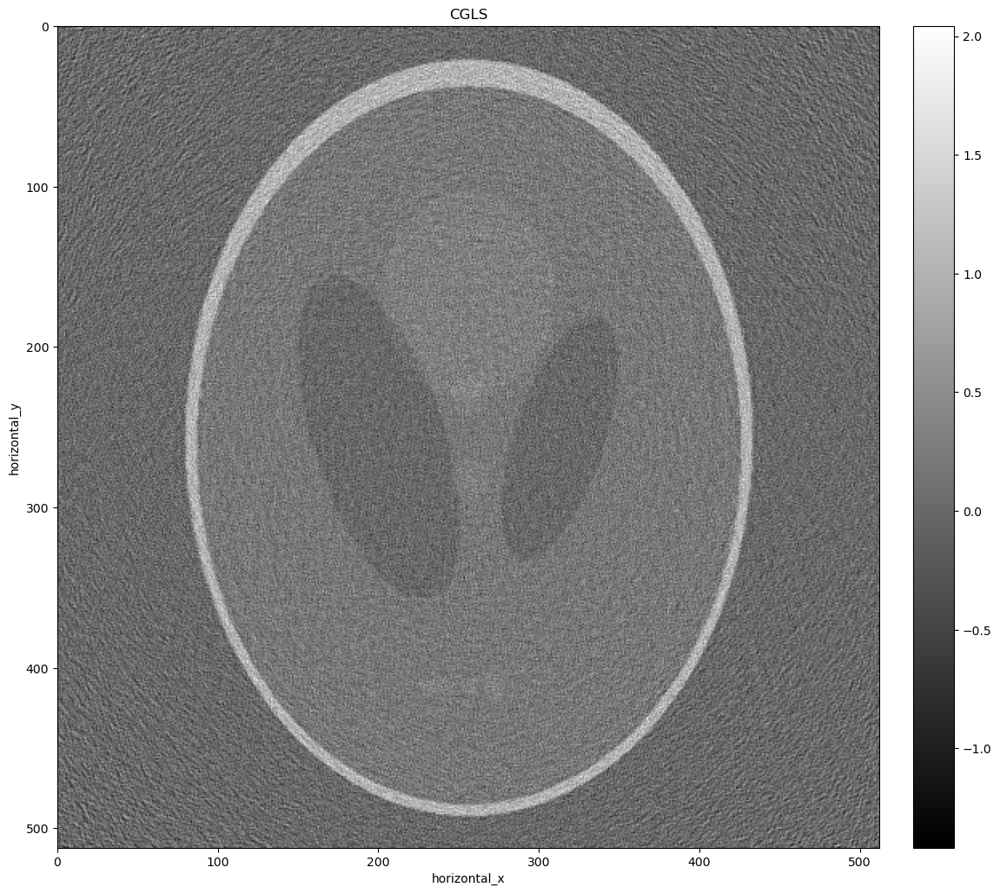

In [64]:
# get and visualise the results
recon_block_noisy = cgls.solution

show2D([recon_block_noisy], ['CGLS'], \
       cmap=cmap, num_cols=1, size=(20,20), origin='upper-left')

In [65]:
save_base_path = '/dtu/cfu/data/userdata18/s220464/storage/PHASE_3/stitched_sh_l'
save_path = os.path.join(save_base_path, 'recon_block_noisy.tiff')
TIFFWriter(data=recon_block_noisy, file_name=save_path).write()